In [1]:
import os
import sys
from glob import glob
import numpy as np
import pandas as pd
import cv2
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from time import time
from matplotlib import image
from torchvision import transforms, datasets, models
import time
import torch
import torch.utils.data as data

import matplotlib.pyplot as plt
import seaborn as sns

## Path configurations

In [2]:
### Configurations
data_dir = 'input/data/train'
img_dir = f'{data_dir}/cropped_images'
df_path = f'{data_dir}/cropped_train.csv'
model_path = f'{data_dir}/models'

In [3]:
df = pd.read_csv(df_path)
df

,Unnamed: 0,Unnamed: 0.1,gender race age isWearing,abs_path,class
0,0,0,female Asian 45 incorrectly wearing,input/data/train/cropped_images/000001_female_...,10
1,1,1,female Asian 45 wearing,input/data/train/cropped_images/000001_female_...,4
2,2,2,female Asian 45 wearing,input/data/train/cropped_images/000001_female_...,4
3,3,3,female Asian 45 wearing,input/data/train/cropped_images/000001_female_...,4
4,4,4,female Asian 45 wearing,input/data/train/cropped_images/000001_female_...,4
...,...,...,...,...,...
18894,18894,18894,male Asian 19 wearing,input/data/train/cropped_images/006959_male_As...,0
18895,18895,18895,male Asian 19 wearing,input/data/train/cropped_images/006959_male_As...,0
18896,18896,18896,male Asian 19 wearing,input/data/train/cropped_images/006959_male_As...,0
18897,18897,18897,male Asian 19 wearing,input/data/train/cropped_images/006959_male_As...,0


# Dataset

In [52]:
class BaseDataset(data.Dataset):

    def __init__(self, transform=None):
        
        self.X = df['abs_path']
        self.y = df['class']
        self.transform = transform

    def set_transform(self, transform):
        
        self.transform = transform

    def __getitem__(self, index):

        image = Image.open(self.X[index]).convert('RGB')
        label = self.y[index]
        
        # 이미지를 Augmentation 시킵니다.
#         image_transform = self.transform(image=np.array(image))['image']
        image_transform = self.transform(image)
        return image_transform, label

    def __len__(self):
        return len(self.X)

# Transformers

In [53]:
mean, std = (0.5, 0.5, 0.5), (0.2, 0.2, 0.2)

In [54]:
from torchvision import transforms

transforms_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(), # data augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean, std) # normalization
])

transforms_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# DataLoader

In [55]:
dataset = BaseDataset()

# train dataset과 validation dataset을 8:2 비율로 나눕니다.
n_val = int(len(dataset) * 0.2)
n_train = len(dataset) - n_val
train_dataset, val_dataset = data.random_split(dataset, [n_train, n_val])

# 각 dataset에 augmentation 함수를 설정합니다.
train_dataset.dataset.set_transform(transforms_train)
val_dataset.dataset.set_transform(transforms_val)

In [56]:
# training dataloader은 데이터를 섞어주어야 합니다. (shuffle=True)
train_loader = data.DataLoader(
    train_dataset,
    batch_size=32,
    num_workers=2,
    shuffle=True
)

val_loader = data.DataLoader(
    val_dataset,
    batch_size=32,
    num_workers=2,
    shuffle=False
)

# Get Device

In [57]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # device object
device

device(type='cuda', index=0)

# Import pre-trained model

In [58]:
model = models.resnet152(pretrained=True)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 18)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Train

In [59]:
import time

num_epochs = 7
start_time = time.time()

for epoch in range(num_epochs):
    """ Training Phase """
    model.train()

    running_loss = 0.
    running_corrects = 0

    # load a batch data of images
    for i, (inputs, labels) in enumerate(train_loader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        # forward inputs and get output
        optimizer.zero_grad()
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        # get loss value and update the network weights
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_dataset)
    epoch_acc = running_corrects / len(train_dataset) * 100.
    print('[Train #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc, time.time() - start_time))

    """ Validation Phase """
    model.eval()

    with torch.no_grad():
        running_loss = 0.
        running_corrects = 0

        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(val_dataset)
        epoch_acc = running_corrects / len(val_dataset) * 100.
        print('[Validation #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc, time.time() - start_time))

[Train #0] Loss: 0.7342 Acc: 77.0966% Time: 115.0649s
[Validation #0] Loss: 0.3019 Acc: 88.7007% Time: 124.4194s
[Train #1] Loss: 0.2104 Acc: 93.0688% Time: 239.4528s
[Validation #1] Loss: 0.1620 Acc: 93.9667% Time: 248.7750s
[Train #2] Loss: 0.0905 Acc: 97.4405% Time: 364.0504s
[Validation #2] Loss: 0.1853 Acc: 94.1254% Time: 373.4302s
[Train #3] Loss: 0.0399 Acc: 99.0807% Time: 488.4684s
[Validation #3] Loss: 0.0801 Acc: 97.3273% Time: 497.8291s
[Train #4] Loss: 0.0210 Acc: 99.6164% Time: 613.0670s
[Validation #4] Loss: 0.0998 Acc: 96.1630% Time: 622.4582s
[Train #5] Loss: 0.0165 Acc: 99.7156% Time: 737.6110s
[Validation #5] Loss: 0.0612 Acc: 97.7507% Time: 747.0295s
[Train #6] Loss: 0.0112 Acc: 99.8214% Time: 862.2181s
[Validation #6] Loss: 0.0774 Acc: 97.2215% Time: 871.5653s


# Save Model

In [60]:
# save the model
torch.save(model.state_dict(), os.path.join(model_path, 'model_resnet152_cropped.pth'))

# Test the model

In [61]:
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import Resize, ToTensor, Normalize

In [62]:
# 테스트 데이터셋 폴더 경로를 지정해주세요.
test_dir = '/opt/ml/input/data/eval'

In [63]:
class TestDataset(Dataset):
    def __init__(self, img_paths, transform):
        self.img_paths = img_paths
        self.transform = transform

    def __getitem__(self, index):
        image = Image.open(self.img_paths[index])

        if self.transform:
            image = self.transform(image)
        return image

    def __len__(self):
        return len(self.img_paths)

In [67]:
from torchvision import transforms
import torchvision

# meta 데이터와 이미지 경로를 불러옵니다.
submission = pd.read_csv(os.path.join(test_dir, 'info.csv'))
image_dir = os.path.join(test_dir, 'cropped_images')

# Test Dataset 클래스 객체를 생성하고 DataLoader를 만듭니다.
image_paths = [os.path.join(image_dir, img_id) for img_id in submission.ImageID]
transform = transforms.Compose([
    Resize((224, 224), Image.BILINEAR),
    ToTensor(),
    Normalize(mean=mean, std=std),
])
dataset = TestDataset(image_paths, transform)

loader = DataLoader(
    dataset,
    shuffle=False
)

# 모델을 정의합니다. (학습한 모델이 있다면 torch.load로 모델을 불러주세요!)
device = torch.device('cuda')

### Evaluate the model

In [68]:
def imshow(input, title):
    # torch.Tensor => numpy
    input = input.numpy().transpose((1, 2, 0))
    # undo image normalization
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # display images
    plt.imshow(input)
    plt.title(title)
    plt.show()

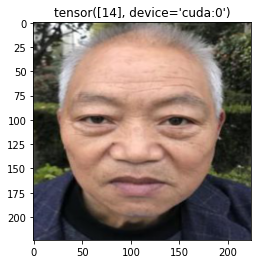

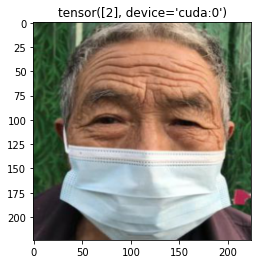

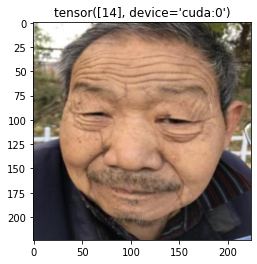

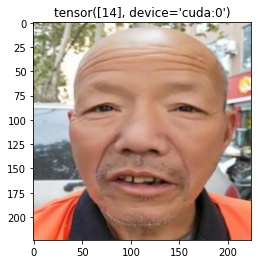

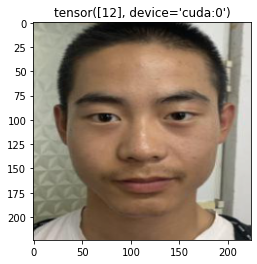

...

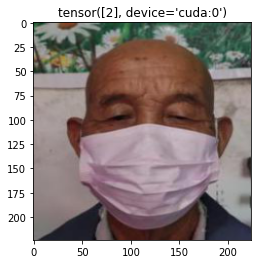

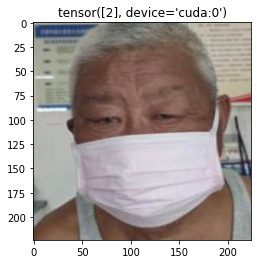

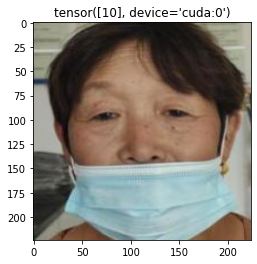

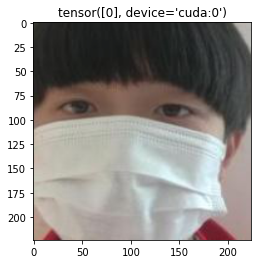

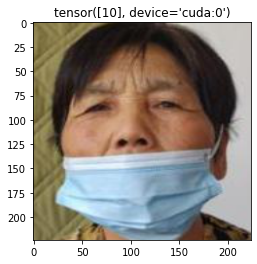

In [69]:
# Test gender model
model.eval()
start_time = time.time()
class_names = [0, 1]

with torch.no_grad():
    running_loss = 0.
    running_corrects = 0

    for i, inputs in enumerate(loader):
        inputs = inputs.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        images = torchvision.utils.make_grid(inputs)
        imshow(images.cpu(), title=preds)
            
        if i == 100:
            break

### Predict the output

In [70]:
# combined model
model.eval()
all_predictions= []
for images in loader:
    with torch.no_grad():
        images = images.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        predicted = predicted.cpu().numpy()
        all_predictions.append(predicted)
        print(predicted)

[14]
[2]
[14]
[14]
[12]
[0]
[8]
[4]
[4]
[3]
[14]
[3]
[6]
[3]
[0]
[4]
[2]
[2]
[8]
[5]
[12]
[1]
[2]
[12]
[2]
[0]
[17]
[2]
[2]
[0]
[0]
[4]
[3]
[4]
[2]
[0]
[3]
[8]
[14]
[0]
[2]
[1]
[8]
[3]
[4]
[2]
[5]
[2]
[0]
[2]
[5]
[9]
[4]
[2]
[2]
[7]
[1]
[0]
[3]
[2]
[2]
[2]
[0]
[15]
[2]
[0]
[9]
[4]
[2]
[5]
[8]
[3]
[2]
[2]
[1]
[0]
[5]
[2]
[4]
[5]
[2]
[2]
[0]
[1]
[0]
[16]
[3]
[16]
[4]
[1]
[12]
[10]
[2]
[1]
[0]
[2]
[2]
[2]
[10]
[0]
[10]
[2]
[2]
[2]
[0]
[3]
[1]
[12]
[4]
[4]
[0]
[16]
[0]
[0]
[4]
[13]
[10]
[5]
[3]
[3]
[3]
[9]
[11]
[4]
[15]
[2]
[2]
[14]
[0]
[14]
[4]
[0]
[8]
[3]
[3]
[14]
[2]
[14]
[0]
[15]
[2]
[2]
[3]
[0]
[0]
[1]
[9]
[4]
[0]
[2]
[1]
[4]
[4]
[12]
[14]
[16]
[3]
[0]
[15]
[15]
[3]
[15]
[4]
[8]
[0]
[5]
[14]
[3]
[2]
[1]
[5]
[14]
[1]
[8]
[8]
[3]
[3]
[1]
[3]
[4]
[2]
[0]
[2]
[17]
[6]
[0]
[5]
[9]
[16]
[17]
[5]
[13]
[0]
[4]
[0]
[12]
[3]
[14]
[12]
[6]
[4]
[0]
[0]
[12]
[2]
[3]
[11]
[5]
[0]
[4]
[16]
[3]
[1]
[6]
[1]
[4]
[8]
[2]
[3]
[0]
[14]
[14]
[2]
[3]
[0]
[2]
[2]
[5]
[0]
[3]
[2]
[14]
[14]
[0]
[8]
[3]
[2]
[0]

In [71]:
for i in range(len(all_predictions)):
    all_predictions[i] = int(all_predictions[i])

print(all_predictions[:5])
print(len(all_predictions))

[14, 2, 14, 14, 12]
12600


In [72]:
submission['ans'] = all_predictions

# 제출할 파일을 저장합니다.
submission.to_csv(os.path.join(test_dir, 'submission.csv'), index=False)
print('test inference is done!')

test inference is done!
